<a href="https://colab.research.google.com/github/rishabh7970/Dog-Breed-Classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at a cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilites for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so its probably best we use deep learning/ transfer learning
* There are 120 breeds of dogs (this means there are 120 different cases)
* There are around 10k+ images in the training set.
* There are around 10k+ images in the test set(these images have no labels, because we'll want to predict them).

In [ ]:
#Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/Dog Vision/"

### Get our worksplace ready!
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version:", tf.__version__)
print ("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES!!!!)" if tf.config.list_physical_devices("GPU") else "not available")


TF version: 2.15.0
TF Hub version: 0.16.1
GPU not available


## Getting our data ready (turning it into Tensors)

With all machine learning model, our data has to be in numerical format. So thats what we'll be doing first. Turning our images into Tensors(numerical representation)

Lets start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head(5))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

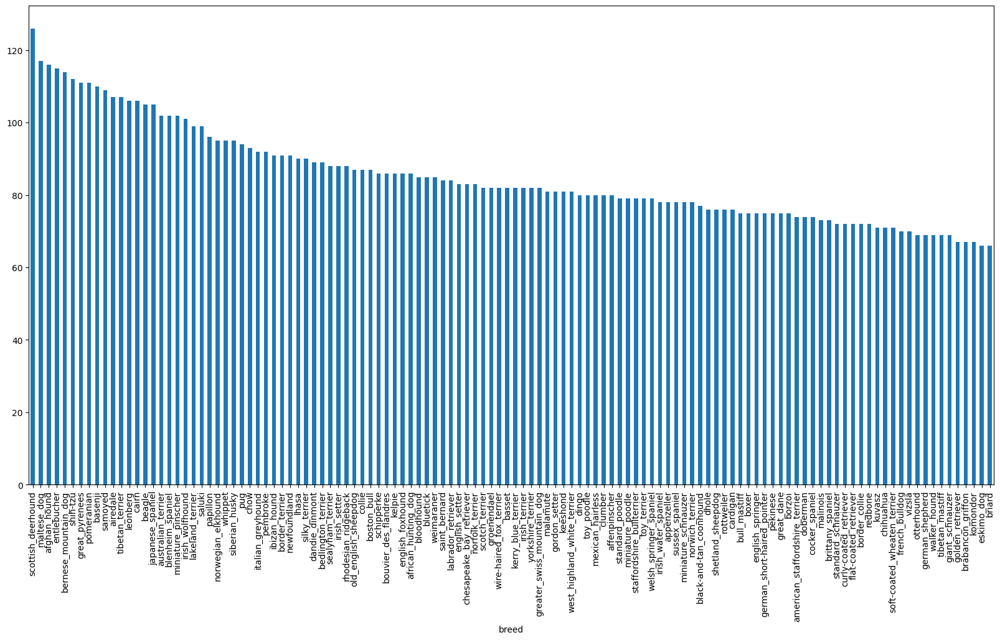

In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

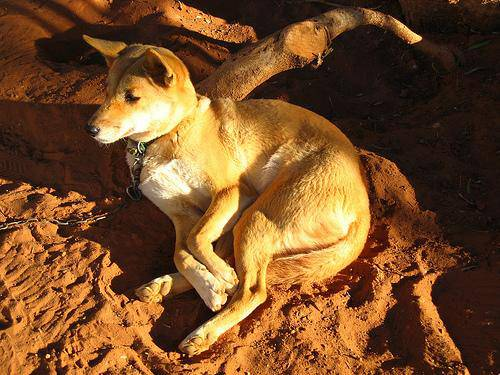

In [ ]:
# Lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Lets get  list of all of our image file pathnames

In [ ]:
labels_csv.head(5)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/"+ fname + ".jpg"for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames od no match actual amount of files")

Filenames match actual amount of files


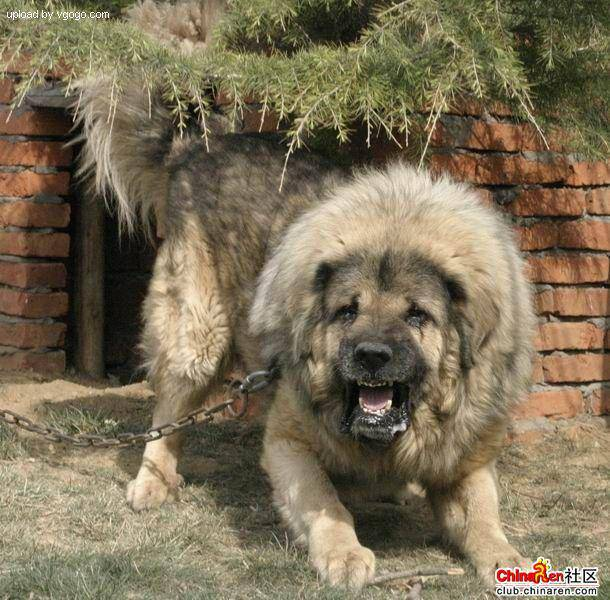

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since eve no got our trining image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels doesnot match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index wherer label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2]) # original label
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesnt come with a validation set, were going to create our own

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000}


In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have a geez at the training data
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image file path as input
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified image

Before we do, lets see what importing an image looks like

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

No we've seen what an image looks like in a tensor. Lets make a function

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a functio for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  #Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels(RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say youre trying to process 10k images in one go... they all might not fit into memory.

So thats why w do about 32 images(batch size) at a time(you can manually adjust the batch size if they need be).

In order to use TensorFLow effectively, we need our data in the form of Tensor tuples which looks like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name an the associated label, process the image and return a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to tun our data into tuples of Tensors
in the form: `(image, label)`, lets make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesnt shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  #If the data is a test dataset, we probably dont have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we dnt need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch




In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, howeveer, these can be a little hard to understand/comprehend, lets visualize them!

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their abels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25(for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

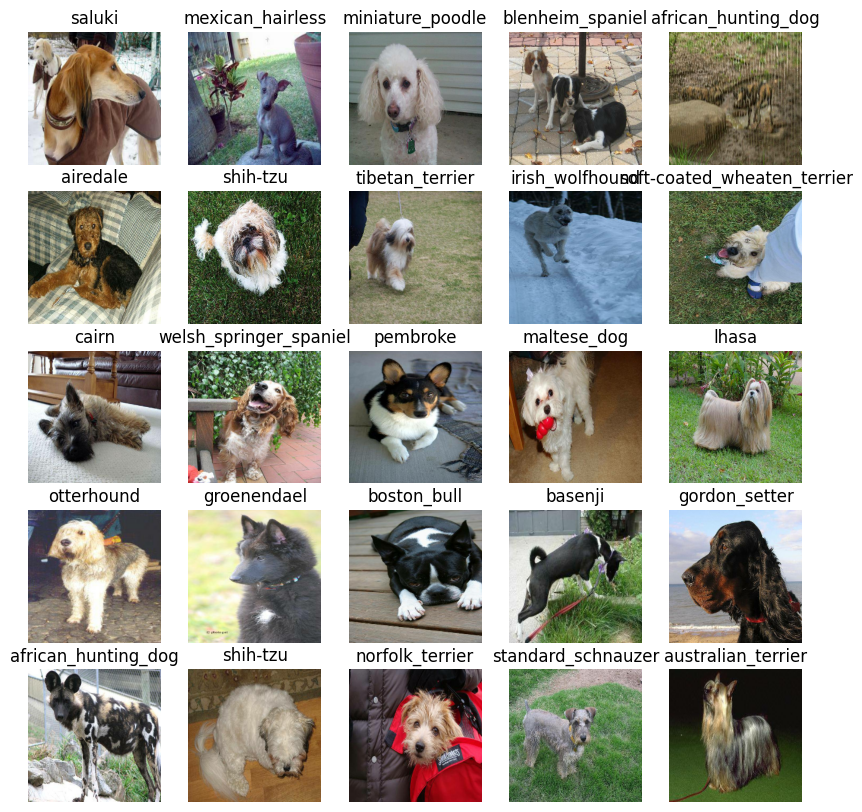

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

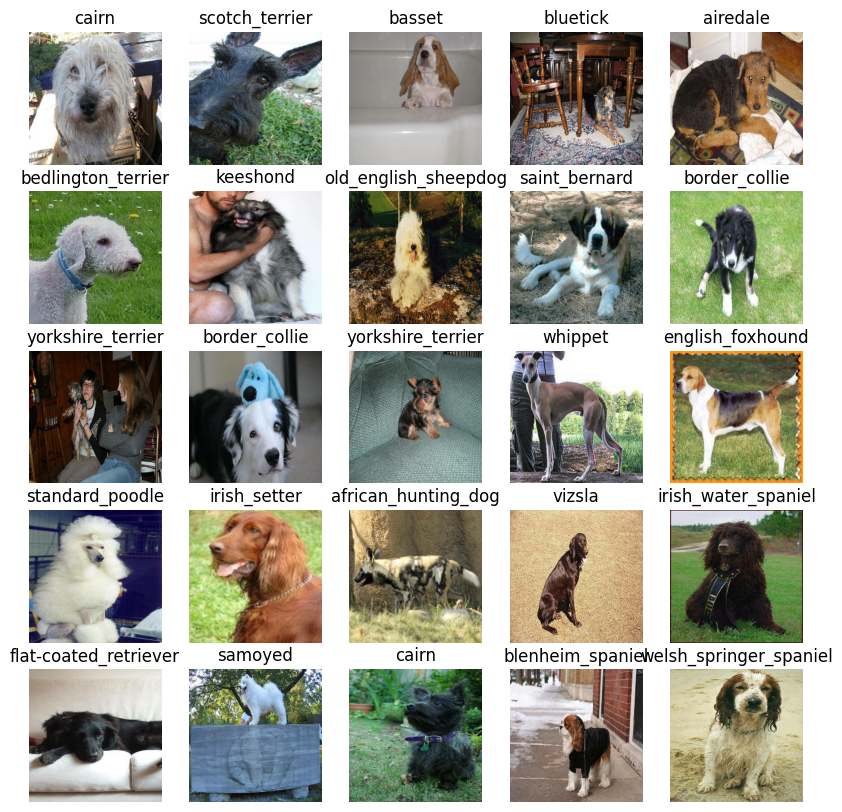

In [ ]:
# Now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define
* The input shape(or image shape, in th form of tensors) of our model
* The output shape(image labels, in the form of tensors) of our model
* The URL of the model we want to use from TensorFlow Hub

In [ ]:
# !pip uninstall -y tensorflow tensorflow_hub
# !pip install tensorflow==2.15.0 tensorflow_hub==0.16.1


# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now weve got our inputs, outputs and model ready to go.
Lets put them together into a Keras deep learnig model

Knowing ths, let create a function wwhich:
* Takes the input shape, outpt shape and the model we've chosen as parameters
* Defines th layers in a Keras model in sequential fashion(do this first, then this, then that)
* COmplies the model (says it should be evaluated and improved)
* Builds the model(tells the model the input shape itll be getting)
* Return the model.

In [ ]:


# Create a function which builds a Keras model:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer1: input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #Layer2: output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents model from training for too long.

### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:
1. Lod the TensorBoard notebook, extenion
2. Create a TensorBoard callbaakc which is able to save logs to directory and pass it to our model's `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBOard log
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early Stopping helps stop our model from overfitting by stopping training if a certain evluation matric stops improving

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1k images to  make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", main:10, max:100, step:10}


In [ ]:
# Check to make sure we are still running on a aGPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


Lets create a function which trins a model:

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for ("NUM_EPOCHS") and the callbacks we'd like to use
* Reutrn the model

In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model


In [ ]:
#Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 270s 9s/step - loss: 4.5656 - accuracy: 0.1075 - val_loss: 3.3850 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 67s 3s/step - loss: 1.6104 - accuracy: 0.6950 - val_loss: 2.1091 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 67s 3s/step - loss: 0.5534 - accuracy: 0.9312 - val_loss: 1.6635 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 68s 3s/step - loss: 0.2478 - accuracy: 0.9875 - val_loss: 1.4846 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 75s 3s/step - loss: 0.1447 - accuracy: 0.9987 - val_loss: 1.4080 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 69s 3s/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.3640 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 69s 3s/

***Question*** It looks like our model is overfitting because its performing far better on the training dataset than the validation dataset, what are some ways to prevent model oerfitting in deep learning neural network?

***Note:*** Overfitting to begin with is a good thing it means our model is learning.


### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 14s 2s/step


array([[9.2082182e-03, 4.1695534e-05, 1.7085853e-03, ..., 2.9300657e-04,
        4.9670747e-05, 1.2645649e-03],
       [1.1396384e-03, 1.9442149e-04, 1.4498027e-02, ..., 1.0328966e-04,
        2.0139462e-03, 1.5097071e-05],
       [1.8267718e-05, 2.9726903e-04, 4.1894255e-05, ..., 2.9459483e-05,
        1.6662443e-05, 7.2395272e-04],
       ...,
       [4.2796702e-05, 5.4305528e-05, 7.3418705e-05, ..., 2.4186227e-05,
        2.1226869e-04, 9.9719153e-05],
       [4.3044244e-03, 1.2355662e-04, 7.3029150e-05, ..., 1.2889213e-04,
        1.7967637e-05, 5.3997096e-03],
       [7.0019980e-04, 8.7318178e-05, 3.3970521e-04, ..., 7.3779761e-03,
        1.1716583e-03, 3.1756437e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
# First prediction
index=90
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[9.2082182e-03 4.1695534e-05 1.7085853e-03 3.3759684e-04 6.7906883e-05
 1.2064755e-05 5.5186473e-02 5.5078097e-04 1.4767148e-04 2.0504314e-04
 1.0295159e-03 1.0351315e-04 2.0090694e-04 1.4129745e-04 2.1536918e-03
 2.3537195e-04 2.9587082e-04 1.1514363e-01 3.8633403e-05 2.2744613e-05
 4.7364057e-04 6.1383580e-05 8.4250314e-06 2.0533765e-03 1.1748368e-05
 6.2365398e-05 4.3992588e-01 5.5410397e-05 5.4022059e-04 1.0646424e-04
 8.1015896e-05 1.3156181e-03 1.3450655e-03 1.9703542e-05 2.4820294e-04
 5.5172253e-02 3.3307791e-05 2.1563050e-04 1.4262626e-04 2.1372935e-04
 1.1794142e-03 3.8685459e-05 9.6288066e-05 1.3753328e-04 1.3547801e-04
 6.1736122e-05 2.1613007e-05 3.6849349e-04 1.4288643e-04 2.0416829e-04
 2.4949751e-04 1.1857445e-04 2.1178779e-04 6.7055858e-05 3.1117623e-05
 1.5516427e-05 1.7605930e-04 7.1548633e-03 7.0715568e-04 4.6852671e-02
 2.0120653e-05 2.8085793e-05 3.1459264e-03 1.3387467e-05 1.7986790e-04
 2.0935867e-02 1.4521867e-04 1.3558865e-04 1.9944636e-02 2.2408023e-04
 1.933

In [ ]:
unique_breeds[39]

'english_foxhound'

Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilites also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[39])
pred_label

'labrador_retriever'

Now since our validation data is still in a batch dtaset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#Unbatchify the alidation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

#Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've gt ways to get :
* Prediction labels
* Validation labels (truth labels)
* Validation images

Lets make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, as an array of truth labels and an arry of images and integers
* Convert the prediction probabiities to predicted labels
* Plot the predicted label, its predicted probability, the truth label and the target image in a single plot  

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred_label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)
  pass

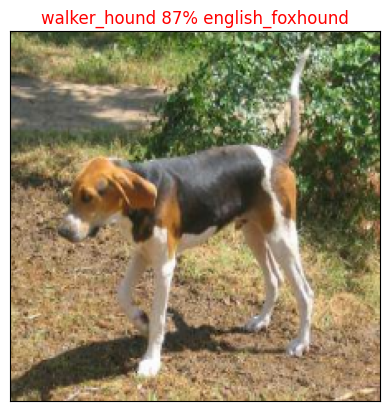

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we,ve got one function to visualize our model's top prediction, let's make another to view our model's top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Find the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



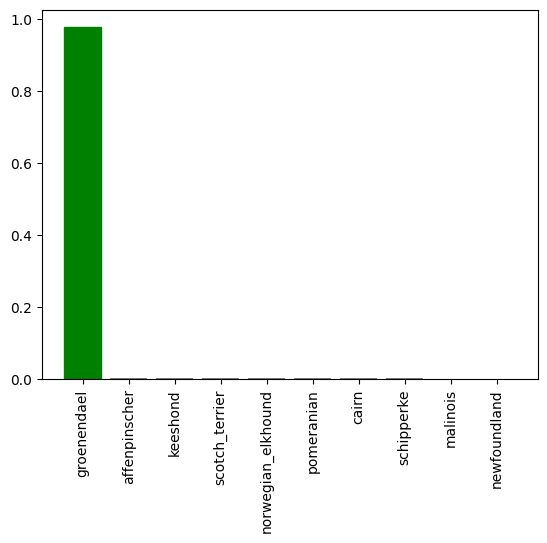

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=77)

Now we've got some functions to help us visualize our predictions and avaluate our model, lets check out a few.

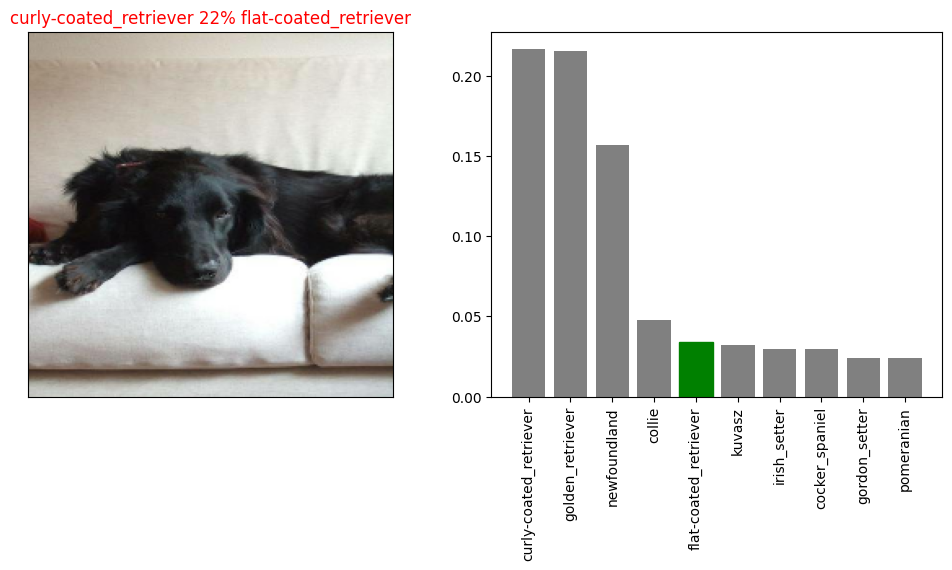

/tmp/ipython-input-63-1834233622.py:17: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(h_pad=1.0)


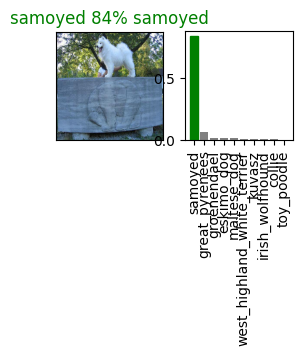

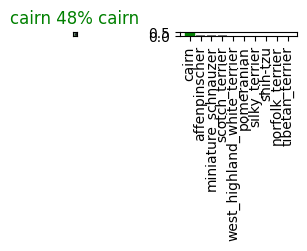

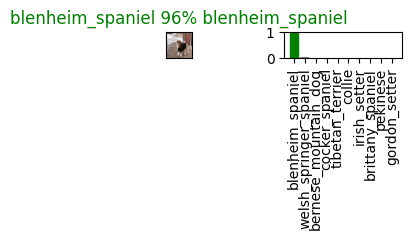

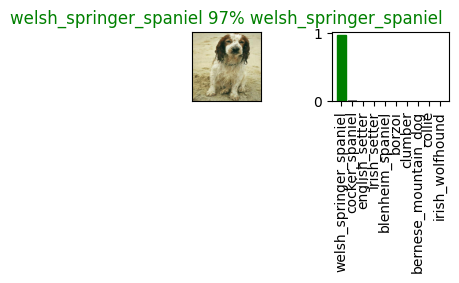

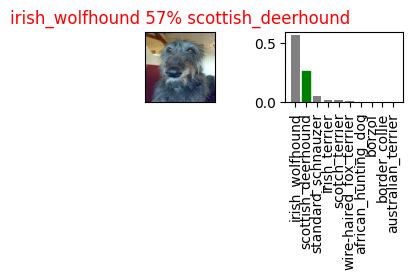

In [ ]:
#Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()

**Question** How would you create a confusion matrix with our predictions and true labels?

##Saving and reloading a training model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix (string)
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to sae and load a trained model, lets make sure they work

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20250715-12151752581744-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Vision/models/20250715-12151752581744-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20250715-06471752562036-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20250715-06471752562036-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 1.2277 - accuracy: 0.6750


[1.2276639938354492, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data
                                 )

7/7 [==============================] - 13s 2s/step - loss: 1.1948 - accuracy: 0.6550


[1.1948341131210327, 0.6549999713897705]

## Training a big dog model (on the full data)


In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_checkpoint = tf
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while bcause the GPU we are using in the runtime has to load all of the image into memory

In [ ]:
#fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 648s 2s/step - loss: 1.3586 - accuracy: 0.6631
Epoch 2/100
320/320 [==============================] - 622s 2s/step - loss: 0.4067 - accuracy: 0.8796
Epoch 3/100
320/320 [==============================] - 612s 2s/step - loss: 0.2419 - accuracy: 0.9330
Epoch 4/100
320/320 [==============================] - 610s 2s/step - loss: 0.1549 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 632s 2s/step - loss: 0.1091 - accuracy: 0.9771
Epoch 6/100
320/320 [==============================] - 605s 2s/step - loss: 0.0795 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 623s 2s/step - loss: 0.0595 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 622s 2s/step - loss: 0.0462 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 630s 2s/step - loss: 0.0372 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 622s 2s/step - loss: 0.032

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20250715-15401752594017-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20250715-15401752594017-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20250715-15401752594017-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20250715-15401752594017-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input nd cover them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filename into test data batches using `crete_data_batches()` and setting the `test_data` parameter to `True` (since the data doesnt have labels)
* Make a predictions array by passing the test batches t the `predict()` method called on our model

In [ ]:
#Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 '/content/drive/MyDrive/Dog Vision/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4a8dfc6e219b20a0cbced41eaf6a435.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e22d81ccf32bd590d8dd66815fd222b7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dddb2b191e1b1de4867f6f5e81236312.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg']

In [ ]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test batch will take a long time to run

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1159s 4s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/test_predictions.csv",
           test_predictions,
           delimiter=",")

In [ ]:
#Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/test_predictions.csv",
                               delimiter=",")

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample ubmission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog unique_breeds
* Add data to the ID column by extrating the test image ID's from their filepaths
* Add data (the prediction probabilities ) to each od the dog breed columns
* Export the dataframe as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["Id"] + list(unique_breeds))
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,id
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e423b91111a1c5b52cc1026086f263f2
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e18a9e69da19fc1a19885d15b7f26e92
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e2f94ad185a2cfa2311c66c3e8bdba17
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,def88eeacc633cbc3d46d5f5fb495379
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e4a8dfc6e219b20a0cbced41eaf6a435


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,id
0,NaN,7.077764e-13,1.745484e-11,6.925314e-10,3.477606e-11,4.623962e-08,9.881055e-11,2.920807e-14,1.978124e-10,6.245177e-09,...,1.092602e-11,2.284212e-06,1.733187e-07,1.110255e-07,4.182870e-12,6.849261e-12,1.204734e-05,3.246441e-11,5.522276e-11,e423b91111a1c5b52cc1026086f263f2
1,NaN,9.709899e-09,1.121911e-10,4.074937e-10,8.051716e-11,7.141386e-06,2.502069e-09,4.484054e-11,1.989498e-11,5.147547e-11,...,3.234228e-09,8.132763e-07,3.275947e-06,4.193001e-09,1.259516e-11,1.204903e-10,5.370601e-07,7.009676e-11,4.493583e-11,e18a9e69da19fc1a19885d15b7f26e92
2,NaN,2.277647e-06,4.934584e-08,1.808053e-10,2.276091e-11,5.183561e-10,8.596985e-12,3.649136e-10,3.941733e-09,1.684399e-08,...,1.103317e-08,5.098931e-08,8.867931e-08,6.550223e-10,4.602410e-11,2.222495e-08,1.022201e-11,4.671685e-06,5.885197e-07,e2f94ad185a2cfa2311c66c3e8bdba17
3,NaN,1.359592e-11,9.252126e-09,3.981770e-10,5.106703e-09,7.619141e-10,1.105748e-14,1.374932e-06,2.494254e-09,1.391734e-05,...,2.296950e-10,1.231746e-13,5.286788e-12,2.436634e-12,1.059593e-08,2.643533e-07,1.944941e-07,1.948731e-06,7.047368e-08,def88eeacc633cbc3d46d5f5fb495379
4,NaN,5.549209e-10,8.582435e-09,1.012899e-11,7.414623e-06,1.045941e-08,1.395414e-05,1.457450e-05,9.731149e-05,3.096648e-05,...,1.052144e-06,1.876345e-06,8.231996e-02,2.816263e-08,2.481807e-10,9.706234e-09,1.779500e-07,6.618404e-06,1.281016e-10,e4a8dfc6e219b20a0cbced41eaf6a435


In [ ]:
#Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making Predictions on Custom Images

To make predictions on Custom Images, we'll:
* Get te filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()` And since our custo images wont have labels, we set the `test_data` parameter to `True`
* Pass the custom images data batch to our model's `predict()` method
* Convert the prediction probabilities into prediction labels
* Compare the prediction labels to the custom images

In [ ]:
import os

custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos"
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path)]
custom_image_paths


['/content/drive/MyDrive/Dog Vision/my-dog-photos/istockphoto-1370010790-1024x1024.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/istockphoto-513392620-1024x1024.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 0s 215ms/step


(2, 120)

In [ ]:
#Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['staffordshire_bullterrier', 'american_staffordshire_terrier']

In [ ]:
#Get custom images (our unbatchify() function wont work since there arent labels... maybe we could fix this later)
custom_images = []

#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


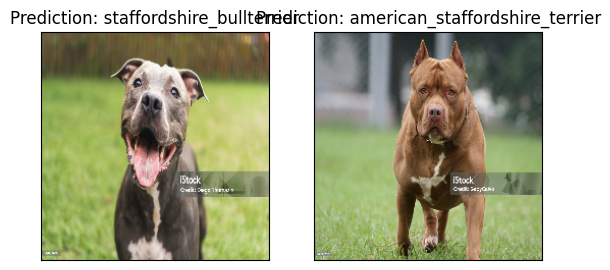

In [ ]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.imshow(image)